## EfficientDet


This notebook is intended to show **EfficientDet** at work. This is a family of convolutional neural networks that aims to achieve state-of-the-art accuracy while using fewer parameters than state-ofthe-art object detectors.

From: [paper](https://arxiv.org/abs/1911.09070)

Implementation proposed in this notebook is from Ross Wightman: [Github Repo](hhttps://github.com/rwightman/efficientdet-pytorch)


Notebook adapted from: 
> - notebooks from classes by [Giuseppe Lisanti](https://www.unibo.it/sitoweb/giuseppe.lisanti/en) and [Lorenzo Stacchio](https://www.unibo.it/sitoweb/lorenzo.stacchio2/en)
> - [https://www.kaggle.com/code/sadilkhan786/global-wheat-detection-pytorch](https://www.kaggle.com/code/sadilkhan786/global-wheat-detection-pytorch)
> - [https://www.kaggle.com/code/shonenkov/training-efficientdet/notebook](https://www.kaggle.com/code/shonenkov/training-efficientdet/notebook))
> - [https://medium.com/data-science-at-microsoft/training-efficientdet-on-custom-data-with-pytorch-lightning-using-an-efficientnetv2-backbone-1cdf3bd7921f](https://medium.com/data-science-at-microsoft/training-efficientdet-on-custom-data-with-pytorch-lightning-using-an-efficientnetv2-backbone-1cdf3bd7921f)

# Dependecies

Install timm and effdet packages in order to use Ross Wightman models (runtime restart is needed).
Instead, ensemble-boxes is a library the contains Python implementation of several methods for ensembling boxes from object detection models inference.
Albumentations library is an alternative to transforms from pytorch.

In [39]:
!pip install timm effdet ensemble-boxes albumentations==0.4.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [40]:
import os
import time
import copy
import random
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import re
from PIL import Image, ImageDraw, ImageFont
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data.sampler import  SubsetRandomSampler
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
from typing import Callable, Dict, List, Tuple, Union
import tqdm
import datetime
from sklearn.model_selection import train_test_split
import timm
from effdet.config.model_config import efficientdet_model_param_dict
from ensemble_boxes import nms, weighted_boxes_fusion
%matplotlib inline

Connect to Drive since I stored EfficientDet checkpoint there. Moreover, I also stored in my Drive a version of the Global Wheat Dataset that we will use in this notebook.

In [41]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [42]:
# clean previous folders with dataset or tensorboard stuff
#!rm -r GlobalWheatDetection/ runs

## Set libraries random seed for experiments reproducibility 

In [43]:
def fix_random(seed: int) -> None:
    """Fix all the possible sources of randomness.

    Args:
        seed: the seed to use. 
    """
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

magic_seed = 42
fix_random(seed=magic_seed)

## Runtime Settings

In [44]:
device = "cpu"
if torch.cuda.is_available:
  print('Gpu available')
  device = torch.device("cuda:0")
else:
  print('Please set GPU via Edit -> Notebook Settings.')

!nvidia-smi

Gpu available
Fri Nov 11 14:59:36 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    26W /  70W |   3572MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                          

## Common Datasets Hyperparameters


Define transformations for input data batch using albumentations library (each transform could be applied with probability p):
> - horizontal and vertical flip
> - random sized cropped and horizontal flip
> - *image resize* -> because of EfficientDet Architecture input image resulotion must be a multiple of 128!
> - normalization of the dataset w.r.t ImageNet mean and stddev

Notice that Compose from albumentations take as input a dictionary with keys *bboxes*, *labels* and *image*, and applies all defined transformations starting from this data that will be provided by the classic Dataset class from Pytorch.

In [45]:
# width/height of all input img is 1024
input_img_size = 1024

# resize images to EfficientDet d0 input resolution, i.e. 512*512
img_size = 512

# Albumentation library has a Normalize with default mean and std = to ImageNet values,
# moreover, bbox_params of Compose allows to Normalize coordinates by dividing for input
# image size (input_img_size) in order to work with small floats instead with big integers
# in range 0 - 1024
data_transforms = {'train': A.Compose([A.HorizontalFlip(p=0.5),
                                       A.VerticalFlip(p=0.5),
                                       A.Resize(height=img_size, 
                                                width=img_size, 
                                                p=1),
                                       A.Normalize(),
                                       ToTensorV2(p=1)],
                                      p=1,
                                      bbox_params=A.BboxParams(format='pascal_voc',
                                                               min_area=0,
                                                               min_visibility=0,
                                                               label_fields=['labels'])),
                   
                   'val': A.Compose([A.Resize(height=img_size, 
                                              width=img_size, 
                                              p=1),
                                     A.Normalize(),
                                     ToTensorV2(p=1)],
                                    p=1,
                                    bbox_params=A.BboxParams(format='pascal_voc',
                                                             min_area=0,
                                                             min_visibility=0,
                                                             label_fields=['labels']))
                   }

num_workers = 0
batch_size = 16 # adapted to resource availability :(

# Global Wheat Detection

The task is to detect wheat heads from outdoor images of wheat plants, including wheat datasets from around the globe (this means, classes = 1, background already accounted by the EfficientDet model from Ross Wightman repo). Using worldwide data, we will focus on a generalized solution to estimate the number and size of wheat heads.

In [46]:
num_classes = 1

Maybe adjust path format to make it easier to change it.

In [47]:
# create folders
!mkdir GlobalWheatDetection

# images
!unzip /content/drive/MyDrive/Colab\ Notebooks/datasets/GlobalWheatDetection/train.zip -d GlobalWheatDetection/
!unzip /content/drive/MyDrive/Colab\ Notebooks/datasets/GlobalWheatDetection/test.zip -d GlobalWheatDetection/

# CSV annotations
!unzip /content/drive/MyDrive/Colab\ Notebooks/datasets/GlobalWheatDetection/train.csv.zip -d GlobalWheatDetection
# !unzip /content/drive/MyDrive/Colab\ Notebooks/datasets/GlobalWheatDetection/sample_submission.csv.zip -d GlobalWheatDetection

Archive:  /content/drive/MyDrive/Colab Notebooks/datasets/GlobalWheatDetection/train.zip
   creating: GlobalWheatDetection/train/
  inflating: GlobalWheatDetection/train/00333207f.jpg  
  inflating: GlobalWheatDetection/train/005b0d8bb.jpg  
  inflating: GlobalWheatDetection/train/006a994f7.jpg  
  inflating: GlobalWheatDetection/train/00764ad5d.jpg  
  inflating: GlobalWheatDetection/train/00b5c6764.jpg  
  inflating: GlobalWheatDetection/train/00b5fefed.jpg  
  inflating: GlobalWheatDetection/train/00b70a919.jpg  
  inflating: GlobalWheatDetection/train/00e903abe.jpg  
  inflating: GlobalWheatDetection/train/00ea5e5ee.jpg  
  inflating: GlobalWheatDetection/train/010b216d4.jpg  
  inflating: GlobalWheatDetection/train/010c93b99.jpg  
  inflating: GlobalWheatDetection/train/010dbcc8f.jpg  
  inflating: GlobalWheatDetection/train/0114c88aa.jpg  
  inflating: GlobalWheatDetection/train/01189a3c3.jpg  
  inflating: GlobalWheatDetection/train/0126b7d11.jpg  
  inflating: GlobalWheatDetect

Once unzipped, tha dataset annotations are in CSV format and contain:
> - the *image ID* that matches up with the filename of a given image
> - *resolution* of the image
> - *bounding box* notation in format **XYXY**
> - origin of the wheat.

## Data Preprocessing

In [48]:
# process file with annotations
annotations = pd.read_csv('GlobalWheatDetection/train.csv')
annotations.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


Minimal data preprocessing before splitting in train and val sets. We focus only on the image id and bounding box columns.

In [49]:
# Adjust bbox column format 
annotations['x_min'] = annotations['bbox'].apply(lambda x:float(re.findall(r'[0-9.]+',x.split(',')[0])[0]))
annotations['y_min'] = annotations['bbox'].apply(lambda x:float(re.findall(r'[0-9.]+',x.split(',')[1])[0]))
annotations['box_width'] = annotations['bbox'].apply(lambda x:float(re.findall(r'[0-9.]+',x.split(',')[2])[0]))
annotations['box_height'] = annotations['bbox'].apply(lambda x:float(re.findall(r'[0-9.]+',x.split(',')[3])[0]))
annotations.drop('bbox',axis=1,inplace=True)

# change to PASCAL VOC annotation format
annotations['x_max'] = annotations['x_min'] + annotations['box_width'] 
annotations['y_max'] = annotations['y_min'] + annotations['box_height']

annotations = annotations[['image_id', 'x_min','y_min','x_max','y_max']]
annotations.head()

,image_id,x_min,y_min,x_max,y_max
0,b6ab77fd7,834.0,222.0,890.0,258.0
1,b6ab77fd7,226.0,548.0,356.0,606.0
2,b6ab77fd7,377.0,504.0,451.0,664.0
3,b6ab77fd7,834.0,95.0,943.0,202.0
4,b6ab77fd7,26.0,144.0,150.0,261.0


In [50]:
annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   image_id  147793 non-null  object 
 1   x_min     147793 non-null  float64
 2   y_min     147793 non-null  float64
 3   x_max     147793 non-null  float64
 4   y_max     147793 non-null  float64
dtypes: float64(4), object(1)
memory usage: 5.6+ MB


# Dataset Class Definition

In [51]:
# Spliting the dataset
train_set, val_set = train_test_split(annotations, test_size=0.2,random_state=42)

*N.B.:* EfficientDet needs bounding boxes format [*y_min*, *x_min*, *y_max*, *x_max*]. See code at [https://github.com/rwightman/efficientdet-pytorch/blob/master/effdet/anchors.py](https://github.com/rwightman/efficientdet-pytorch/blob/master/effdet/anchors.py). However, its predicted boxes are in the following format: [*x_min*, *y_min*, *x_max*, *y_max*, *score*, *class*].

In [52]:
class GWDataset(Dataset):
    def __init__(
        self,
        path_images: str,
        original_img_size: int,
        dataset: pd.DataFrame,
        transforms: torchvision.transforms = None,
    ) -> None:
        """Init the dataset

        Args:
            path_images: the path to the folder containing the images.
            dataset: padas dataframe with the annotations.
            transforms: the transformation to apply to the dataset.
        """
        self.path_images = path_images
        self.original_img_size=original_img_size
        self.dataset = dataset
        self.transforms = transforms
      
    def __getitem__(self, idx):
        # get image as a PIL object
        image_id = self.dataset.iloc[idx]['image_id']
        path_image = os.path.join(self.path_images, f'{image_id}.jpg')
        image = Image.open(path_image).convert("RGB")
        height, width = image.size

        # get boxes from dataframe rows and
        # be ware that Pytorch implementation of EfficientDet, require data in 
        # format YXYX and not XYXY!
        rows = self.dataset[self.dataset['image_id']==image_id]
        boxes = rows[['x_min', 'y_min', 'x_max', 'y_max']].values
        
        # there is only one class
        labels = torch.ones((boxes.shape[0],), dtype=torch.int64)

        sample = {
            'image': np.array(image, dtype=np.float32),
            'bboxes': boxes,
            'labels' : labels,
        }

        target = {}
        
        for i in range(10):
          sample = self.transforms(**sample)
          if len(sample['bboxes']) > 0:
            target['bboxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
            # yxyx switch
            target['bboxes'][:,[0,1,2,3]] = target['bboxes'][:,[1,0,3,2]]
            break  
          
        # image normalized
        image = sample['image']
        labels = sample['labels']

        # img_size and img_scale needed by the model during evaluation
        target['labels'] = torch.as_tensor(labels)
        target['image_id'] = torch.tensor([idx])
        target['img_size'] = (height, width)
        target['img_scale'] = torch.tensor([1.0])

        return image, target

    def __len__(self):
        return self.dataset.shape[0]

Just take a part of the dataset while playing with the architecture.

In [53]:
train_dataset = GWDataset(path_images='/content/GlobalWheatDetection/train', 
                          dataset=train_set[:int(len(train_set)/10)], 
                          original_img_size=input_img_size,
                          transforms=data_transforms['train'])

validation_dataset = GWDataset(path_images='/content/GlobalWheatDetection/train', 
                               dataset=val_set[:int(len(val_set)/10)], 
                               original_img_size=input_img_size,
                               transforms=data_transforms['val'])

## Visualize a Data Sample

In [54]:
def show_images(df: pd.DataFrame,
                idx: int,
                folder: str,
                title: str,
                linecolor: str):
    """ Function to show images with detected wheat heads"""
    fig, axs = plt.figsize=(10,10)
    
    image_id = df.iloc[idx, :].image_id

    path=os.path.join(folder, image_id + '.jpg')
    image=Image.open(path)

    objects=df[df['image_id']==image_id][['x_min','x_max','y_min','y_max']].values
    # Drawing on the Image
    draw=ImageDraw.Draw(image)

    for box in objects:
        draw.rectangle([box[0],box[2],box[1],box[3]],width=2,outline=linecolor)

    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.axis('off')
            
    plt.suptitle(title + f' - {image_id}')

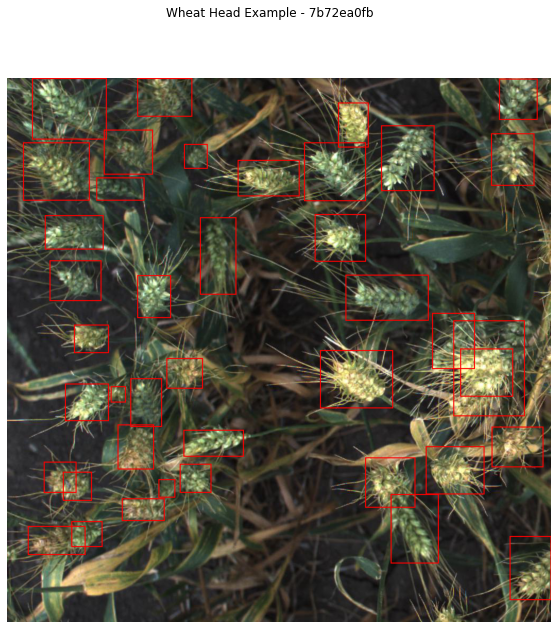

In [55]:
idx = 100
show_images(annotations, idx, '/content/GlobalWheatDetection/train', 'Wheat Head Example','red')

## Deep Learning models: utils

Here we define data loaders from Pytorch's dataset utils. Notice that we should also make more data manipulations in the collate function, instead later on in the training loop.
Important to notice that the format of data returned by collate fn is thought to meet parameter requirements of DetBenchTrain during training and and DetBenchPredict during validation.

In [56]:
def collate_fn(batch):
    images, targets = tuple(zip(*batch))
    
    images = torch.stack(images)
    images = images.float().to(device)

    boxes = [target['bboxes'].float().to(device) for target in targets]
    labels = [target['labels'].float().to(device) for target in targets]
    img_size = torch.tensor([target['img_size'] for target in targets]).float().to(device)
    img_scale = torch.tensor([target['img_scale'] for target in targets]).float().to(device)

    annotations = {
        'bbox': boxes,
        'cls': labels,
        'img_size': img_size,
        'img_scale': img_scale,
    }

    return images, annotations

train_loader = DataLoader(train_dataset,
                          batch_size=batch_size,
                          shuffle=True,
                          drop_last=True,
                          num_workers=num_workers,
                          collate_fn=collate_fn)
valid_loader = DataLoader(validation_dataset,
                          batch_size=batch_size,
                          shuffle=False,
                          drop_last=True,
                          num_workers=num_workers,
                          collate_fn=collate_fn)

Main train loop from which runnning train loss and running validation loss are computed. Every scalar is recorded to tensorboard.

In [57]:
def train_loop(model: torch.nn.Module, 
               train_loader: DataLoader, 
               valid_loader: DataLoader, 
               epochs: int, 
               optimizer: torch.optim, 
               lr_scheduler: torch.optim.lr_scheduler,
               device: str, 
               writer: SummaryWriter):
  
    train_losses, valid_losses, valid_outputs = [], [], []
    
    for epoch in range(epochs):
      print("---- Train Epoch %s ----" % (epoch + 1))
      model.train()
      size_ds_train = len(train_loader.dataset)
      num_batches = len(train_loader) 
      running_train_loss = 0.0
      log_interval = num_batches//5
      train_batches = 0

      for batch_index, (images, annotations) in tqdm.tqdm(enumerate(train_loader), desc="Training on train set", total=len(train_loader)):
          # acc samples
          train_batches += 1

          # get inputs: images and annotations already prepared accordingly by collate fn
          # zero the parameter gradients
          optimizer.zero_grad()

          # forward + backward + optimize
          outputs = model(images, annotations)

          loss_class = outputs['class_loss']
          loss_boxes_regr = outputs['box_loss']
          losses = outputs['loss']
          
          losses.backward()
          optimizer.step()

          # learing rate scheduler step
          if lr_scheduler:            
            lr_scheduler.step()

          # print statistics
          running_train_loss += losses.item()

          if log_interval > 0:
            if batch_index % log_interval == 0:        
                print(f'\n[{batch_index + 1:5d} "/" {len(train_loader)}] train loss: {running_train_loss / train_batches}')                        
                global_step = batch_index + (epoch * num_batches)                 
                writer.add_scalar('Metrics/Loss_Train_IT_Sum', losses, global_step)         
                writer.add_scalar('Metrics/Loss_Train_IT_Boxes', loss_boxes_regr, global_step)     
                writer.add_scalar('Metrics/Loss_Train_IT_Classification', loss_class, global_step)  


      train_losses.append(running_train_loss / train_batches)

      print()
      with torch.no_grad():
          print("---- Val Epoch %s ----" % (epoch + 1))
          model.eval()
          running_valid_loss = 0.0
          valid_batches = 0

          for batch_index, (images, annotations) in tqdm.tqdm(enumerate(valid_loader), desc="Evaluating on validation set", total=len(valid_loader)):
              # acc samples
              valid_batches += 1

              # get inputs: also img_size, img_scale and img_ids are needed for evaluation and metrics recording

              # forward
              output = model(images, annotations)
              losses = output['loss']

              # print statistics
              running_valid_loss += losses.item()
          
          valid_losses.append(running_valid_loss / valid_batches)
          print(f'Validation loss: {running_valid_loss / valid_batches}')
          writer.add_scalar('Metrics/Loss_running_val', running_valid_loss / valid_batches, epoch + 1)

    return train_losses, valid_losses

Utilities to observe number of parameters required by a network and to freeze/unfreeze layers in order to perform fine-tuning.

In [58]:
def count_parameters(model: torch.nn.Module):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def set_requires_grad_for_layer(model: torch.nn.Module, train: bool) -> None:
    """Sets the attribute requires_grad to True or False for each parameter.
        
        Args:
            layer: the model to freeze.
            train: if true train the model parameter.
    """
    for p in model.parameters():
        p.requires_grad = train

## Keep Track on experiments with tensorboard

In [59]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# open tensorboard with experiments in "runs" folder 
# initially no experiments will be found, please reload after you execute the following experiments on CNN and VIT with the upper right bottom in the view
%tensorboard --logdir runs 

# !rm -rf "runs/" # use this to remove the runs folder and so to reset all your tracked experiments

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1157), started 0:20:03 ago. (Use '!kill 1157' to kill it.)

<IPython.core.display.Javascript object>

# EfficientDet: model definition

As we can see from Ross Wightman's repo, there are plenty of different implementations of EfficientDet. The models retrained and implemented by Ross Wightman are 'efficientdet_\*.' Instead, models starting with 'tf' have been directly ported from TensorFlow weights in order to be used also in PyTorch:

> - *ap* stands for 'AdvProp', an advanced fine-tuning procedure
> - *lite* models are quantized in order to fit in a device like a phone.

Here we are obliged to select the smaller in terms of parameters, i.e. the **d0** configuration, due to resource constraints.


In [60]:
from effdet.config.model_config import efficientdet_model_param_dict
list(efficientdet_model_param_dict.keys())

['efficientdet_d0',
 'efficientdet_d1',
 'efficientdet_d2',
 'efficientdet_d3',
 'efficientdet_d4',
 'efficientdet_d5',
 'efficientdetv2_dt',
 'efficientdetv2_ds',
 'resdet50',
 'cspresdet50',
 'cspresdext50',
 'cspresdext50pan',
 'cspdarkdet53',
 'cspdarkdet53m',
 'mixdet_m',
 'mixdet_l',
 'mobiledetv2_110d',
 'mobiledetv2_120d',
 'mobiledetv3_large',
 'efficientdet_q0',
 'efficientdet_q1',
 'efficientdet_q2',
 'efficientdet_w0',
 'efficientdet_es',
 'efficientdet_em',
 'efficientdet_lite0',
 'tf_efficientdet_d0',
 'tf_efficientdet_d1',
 'tf_efficientdet_d2',
 'tf_efficientdet_d3',
 'tf_efficientdet_d4',
 'tf_efficientdet_d5',
 'tf_efficientdet_d6',
 'tf_efficientdet_d7',
 'tf_efficientdet_d7x',
 'tf_efficientdet_d0_ap',
 'tf_efficientdet_d1_ap',
 'tf_efficientdet_d2_ap',
 'tf_efficientdet_d3_ap',
 'tf_efficientdet_d4_ap',
 'tf_efficientdet_d5_ap',
 'tf_efficientdet_lite0',
 'tf_efficientdet_lite1',
 'tf_efficientdet_lite2',
 'tf_efficientdet_lite3',
 'tf_efficientdet_lite3x',
 'tf_ef

Now we fine-tune the model, using a pre-trained backbone (from EfficientNet CNN family).
The following listed below, are different backbones available for EfficientDet detectors (notice that there are also v2 backbones) .

In [61]:
timm.list_models('*efficientnet*')

['efficientnet_b0',
 'efficientnet_b0_g8_gn',
 'efficientnet_b0_g16_evos',
 'efficientnet_b0_gn',
 'efficientnet_b1',
 'efficientnet_b1_pruned',
 'efficientnet_b2',
 'efficientnet_b2_pruned',
 'efficientnet_b2a',
 'efficientnet_b3',
 'efficientnet_b3_g8_gn',
 'efficientnet_b3_gn',
 'efficientnet_b3_pruned',
 'efficientnet_b3a',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'efficientnet_b8',
 'efficientnet_cc_b0_4e',
 'efficientnet_cc_b0_8e',
 'efficientnet_cc_b1_8e',
 'efficientnet_el',
 'efficientnet_el_pruned',
 'efficientnet_em',
 'efficientnet_es',
 'efficientnet_es_pruned',
 'efficientnet_l2',
 'efficientnet_lite0',
 'efficientnet_lite1',
 'efficientnet_lite2',
 'efficientnet_lite3',
 'efficientnet_lite4',
 'efficientnetv2_l',
 'efficientnetv2_m',
 'efficientnetv2_rw_m',
 'efficientnetv2_rw_s',
 'efficientnetv2_rw_t',
 'efficientnetv2_s',
 'efficientnetv2_xl',
 'gc_efficientnetv2_rw_t',
 'tf_efficientnet_b0',
 'tf_efficientnet_b0_ap',
 'tf_effic

In order to instantiate an EfficientDet model, we need to provide a configuration dictionary, with our problem specific constraint (e.g. number of classes, type of backbone and resolution). After this, we load both backbone and *HeadNet* (FPN) and the training can be performed.

In [62]:
from effdet.config.model_config import efficientdet_model_param_dict
from effdet import get_efficientdet_config, EfficientDet, DetBenchTrain, DetBenchPredict
from effdet.efficientdet import HeadNet
import gc

def model_definition(inference=False,
                     checkpoint_path='',
                     num_classes=1,
                     model_name='tf_efficientdet_d0',
                     v2_backbone=False,
                     pretrained_backbone=False,
                     freeze_backbone=True):
    """
    Define a configuration to choose a detector from EfficientDet family.

    Args:
        inference: false to get model to train.
        checkpoint_path: path to the pre-trained/fine-tuned model.
        num_classes: output classes of the classifier from the detector.
        model_name: sepcifies the architecture to select.
        v2_backbone: true for using a new version of efficient net backbone.
        pretrained_backbone: false to load model checkpoints from models dir.
        freeze_backbone: true to avoid changing also weights of the backbone during training.
    Return:
        model wrapped in a specific class for training or inference.
    """
    if v2_backbone:
      # register backbone to a dictionary to use it in get_efficientdet_config
      efficientdet_model_param_dict[model_name] = dict(
        name=model_name,
        backbone_name=model_name,
        backbone_args=dict(drop_path_rate=0.2),
        num_classes=num_classes,
        image_size=(512, 512),
        url='')

    # get parameter dictionary and modify configuration for the specific GWDataset
    config = get_efficientdet_config(model_name)
    net = EfficientDet(config, pretrained_backbone=pretrained_backbone)

    # fine-tune, load tf_efficient_det_d0 or tf_efficient_det_d0_ap checkpoints
    if not inference and not v2_backbone:
        checkpoint = torch.load(checkpoint_path)
        net.load_state_dict(checkpoint)

    # reset_head will change config to meet our problem number of classes
    if num_classes != config.num_classes:
        net.reset_head(num_classes=num_classes)

    if inference:
        # load the just trained model
        checkpoint = torch.load(checkpoint_path)
        net.load_state_dict(checkpoint)

        # free memory
        del checkpoint
        gc.collect()

        return DetBenchPredict(net)

    else:
        if freeze_backbone:
            set_requires_grad_for_layer(net.backbone, False)

        return DetBenchTrain(net, config)



We will use TensorFlow weights in order to make a comparise with the AdvProp procedure later.

In [63]:
# get model and print infos
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/models/pre-trained'
efficient_det_model_name = 'tf_efficientdet_d0'
efficient_det_model = model_definition(model_name=efficient_det_model_name,
                                       checkpoint_path=os.path.join(checkpoint_path, 'tf_efficientdet_d0_34-f153e0cf.pth'),
                                       v2_backbone=False,
                                       pretrained_backbone=False)

print(f'Model: {efficient_det_model_name}')
print(f'Parameters: {count_parameters(efficient_det_model)}')
print('EfficientDet configuration:')
for k, v in efficient_det_model.config.items():
  print(f'- {k}: {str(v)}')

# free memory
gc.collect()
torch.cuda.empty_cache()
efficient_det_model.to(device)

Model: tf_efficientdet_d0
Parameters: 232614
EfficientDet configuration:
- name: tf_efficientdet_d0
- backbone_name: tf_efficientnet_b0
- backbone_args: {'drop_path_rate': 0.2}
- backbone_indices: None
- image_size: [512, 512]
- num_classes: 1
- min_level: 3
- max_level: 7
- num_levels: 5
- num_scales: 3
- aspect_ratios: [[1.0, 1.0], [1.4, 0.7], [0.7, 1.4]]
- anchor_scale: 4.0
- pad_type: same
- act_type: swish
- norm_layer: None
- norm_kwargs: {'eps': 0.001, 'momentum': 0.01}
- box_class_repeats: 3
- fpn_cell_repeats: 3
- fpn_channels: 64
- separable_conv: True
- apply_resample_bn: True
- conv_bn_relu_pattern: False
- downsample_type: max
- upsample_type: nearest
- redundant_bias: True
- head_bn_level_first: False
- head_act_type: None
- fpn_name: None
- fpn_config: None
- fpn_drop_path_rate: 0.0
- alpha: 0.25
- gamma: 1.5
- label_smoothing: 0.0
- legacy_focal: False
- jit_loss: False
- delta: 0.1
- box_loss_weight: 50.0
- soft_nms: False
- max_detection_points: 5000
- max_det_per_ima

DetBenchTrain(
  (model): EfficientDet(
    (backbone): EfficientNetFeatures(
      (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNormAct2d(
        32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
        (drop): Identity()
        (act): SiLU(inplace=True)
      )
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (bn1): BatchNormAct2d(
              32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): SiLU(inplace=True)
            )
            (se): SqueezeExcite(
              (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (act1): SiLU(inplace=True)
              (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (gate): Sigmoi

## Training

Just perform an epoch over a part of the dataset to show that everything works. Training time over a tenth of the dataset takes 732s, i.e. about 12 minutes.

In [64]:
epochs = 1
lr=0.0002
optimizer = optim.AdamW(efficient_det_model.parameters(), lr=lr)
# scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)
scheduler = None

# track experiments
writer = SummaryWriter(log_dir = "runs/EFFICIENTDET_%s" % str(datetime.datetime.now())
                                                                .replace(' ', '_')
                                                                .replace('-', '_')
                                                                .replace(':', '_')
                                                                .replace('.', '_'))

start_time = time.time()
train_losses, val_losses = train_loop(efficient_det_model, train_loader, valid_loader, epochs, optimizer, scheduler, device, writer)
duration = time.time() - start_time

print('Execution time: ', duration)

writer.flush() # method to make sure that all pending events have been written to disk.
writer.close()

---- Train Epoch 1 ----


Training on train set:   0%|          | 1/738 [00:01<16:52,  1.37s/it]


[    1 "/" 738] train loss: 1.7818973064422607


Training on train set:  20%|██        | 148/738 [02:17<08:00,  1.23it/s]


[  148 "/" 738] train loss: 1.287358083032273


Training on train set:  40%|███▉      | 295/738 [04:18<05:59,  1.23it/s]


[  295 "/" 738] train loss: 1.1135875794847132


Training on train set:  60%|█████▉    | 442/738 [06:19<04:04,  1.21it/s]


[  442 "/" 738] train loss: 1.0354073588395012


Training on train set:  80%|███████▉  | 589/738 [08:21<02:02,  1.21it/s]


[  589 "/" 738] train loss: 0.9902256049203144


Training on train set: 100%|█████████▉| 736/738 [10:21<00:01,  1.22it/s]


[  736 "/" 738] train loss: 0.9593554803210756


Training on train set: 100%|██████████| 738/738 [10:23<00:00,  1.18it/s]



---- Val Epoch 1 ----


Evaluating on validation set:   0%|          | 0/184 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/effdet/bench.py:55: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes
Evaluating on validation set: 100%|██████████| 184/184 [01:58<00:00,  1.55it/s]

Validation loss: 1.0305524523491445
Execution time:  742.169792175293


## Save Model for inference

EfficientDet models can be saved just like any other model in Pytorch.

In [65]:
model_path = '/content/drive/MyDrive/Colab Notebooks/models/tf_efficientdet_d0_test.pth'

torch.save(efficient_det_model.model.state_dict(), model_path)

## Test On Unseen Data

Now we restore the just trained model and perform some inference, switching from DetBenchTrain to DetBenchPredict (inference=True).

In [66]:
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/models'
efficient_det_model_name = 'tf_efficientdet_d0'
efficient_det_model = model_definition(model_name=efficient_det_model_name,
                                       checkpoint_path=os.path.join(checkpoint_path, 'tf_efficientdet_d0_test.pth'),
                                       inference=True,
                                       v2_backbone=False,
                                       pretrained_backbone=False)
efficient_det_model.to(device)

DetBenchPredict(
  (model): EfficientDet(
    (backbone): EfficientNetFeatures(
      (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNormAct2d(
        32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
        (drop): Identity()
        (act): SiLU(inplace=True)
      )
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (bn1): BatchNormAct2d(
              32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): SiLU(inplace=True)
            )
            (se): SqueezeExcite(
              (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (act1): SiLU(inplace=True)
              (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (gate): Sigm

Collect test data as a list of Pillow objects.
There aren't ground truth bboxes associated with test data because GWDataset was a competition.

In [67]:
# gather test images in a list of PIL objects
test_path = '/content/GlobalWheatDetection/test'

test_image_ids = []
images = []
for image_id in os.listdir(test_path):
  path_image = os.path.join(test_path, f'{image_id}')
  images.append(Image.open(path_image).convert('RGB'))
  test_image_ids.append(image_id[:-4])

num_images = len(images)

# we will predict boxes in images that are 512*512, so rescale to 1024*1024,
# i.e. original resolution, must be done
image_sizes = [(image.size[1], image.size[0]) for image in images]

images_tensor = []
for  image in images:
  images_tensor.append(
      data_transforms['val'](
              image=np.array(image, dtype=np.float32),
              labels=np.ones(1),
              bboxes=np.array([[0, 0, 1, 1]]) # fake, just need image transformation
          )['image'] 
      )

images_tensor = torch.stack(images_tensor).float().to(device)
img_info = {
          'img_size': torch.tensor(image_sizes).float().to(device),
          'img_scale': torch.ones(num_images).float().to(device)
          }

In [68]:
# test model
efficient_det_model.eval()
with torch.no_grad():
  detections = efficient_det_model(images_tensor,
                                   img_info=img_info)
  detections = detections.cpu().numpy()

All the predictions are gathered in a pandas dataframe in order to analyze results in a clearer way.

In [69]:
def build_output_dataframe(scaled_bboxes: List,
                           test_image_ids: List):
    """
    Build a pandas dataframe to visualize the predicted boxes.

    Args:
        scaled_bboxes: predicted bbox for each test image.
        test_image_ids: test image ids.
    Return:
        predicted_data: pandas dataframe in a suitable format to be used with show_images.
    """

    predicted_data = {
        'image_id': [],
        'x_min': [],
        'y_min': [],
        'x_max': [],
        'y_max': []
    }

    for i in range(len(scaled_bboxes)):
        for box in scaled_bboxes[i]:
            predicted_data['image_id'].append(test_image_ids[i])
            predicted_data['x_min'].append(box[0])
            predicted_data['y_min'].append(box[1])
            predicted_data['x_max'].append(box[2])
            predicted_data['y_max'].append(box[3])

    predicted_data = pd.DataFrame(predicted_data)

    return predicted_data


With post processing, we extract data from the raw output of the detector, so that we can rescale boxes and apply WBF with IoU threshold.

In [70]:
def post_process(detections,
                 image_sizes,
                 confidence_threshold=0.001,
                 iou_threshold=0.05,
                 skip_box_thr=0.04,
                 img_size=512):
    """
    Process prediction of the efficient det, considering that each box have to be rescaled in
    order to be displayed over the test image in order to see its effectiveness.

    Args:
        detections: detected bboxes by the fine-tuned efficient det.
        image_sizes: list of pair (height, width) for each image in order to rescale bboxes correctly.
        confidence_threshold: confidence threshold.
        iou_threshold: IoU value for boxes to be a match.
        skip_box_thr: exclude boxes with score lower than this variable.
        img_size: needed to correctly perform scaling of bboxes.

    Return:
        Lists of scaled bboxes, prediction scores and classes.

    """

    # model's output processing to display predicted boxes
    prediction_boxes = []
    prediction_scores = []
    prediction_classes = []
    
    for i in range(len(detections)):
        # get predicted bbox coordinates for a image
        boxes = detections[i][:, :4]
        # get scores for a image bboxes
        scores = detections[i][:, 4]
        # get classes for a image bboxes
        classes = detections[i][:, 5]

        # np.where results are wrapped in a numpy array
        indexes = np.where(scores > confidence_threshold)[0]
        
        boxes = boxes[indexes]
        scores = scores[indexes]
        classes = classes[indexes]

        boxes = [(boxes / (img_size - 1)).tolist()]
        scores = [scores.tolist()]
        classes = [classes.tolist()]

        boxes, scores, classes = weighted_boxes_fusion(
            boxes,
            scores,
            classes,
            iou_thr=iou_threshold,
            skip_box_thr=skip_box_thr
        )
        
        boxes = boxes * (img_size - 1)

        prediction_boxes.append(boxes.tolist())
        prediction_scores.append(scores.tolist())
        prediction_classes.append(classes.tolist())

    # rescale boxes in order to be put on a (1024, 1024) image
    scaled_bboxes = []
    for bboxes, img_dims in zip(prediction_boxes, image_sizes):
        im_h, im_w = img_dims  # (1024, 1024)

        if len(bboxes) > 0:
            scaled_bboxes.append(
                (np.array(bboxes) * [im_w / img_size, im_h / img_size, im_w / img_size, im_h / img_size]).tolist())
        else:
            scaled_bboxes.append(bboxes)
    
    return scaled_bboxes, prediction_scores, prediction_classes


In [71]:
def plot_predictions(num_images,
                     detections,
                     test_image_sizes,
                     test_images_ids,
                     confidence_threshold=0.2) -> pd.DataFrame:
    """
    Given the output of efficient det d0, apply NMS or WBFand then save figure with predicted boxes on the test image.

    Args:
        num_images: number of test images.
        detections: output from efficient det d0.
        test_image_sizes: list of pair (height,width) associated with each test image.
        test_images_ids: images identifier to build dataframe.
        confidence_threshold: threshold to decide which boxes to delete from predictions.
     Returns:
        predicted_data: pandas dataframe with the same format as annotations

    """

    print('Number of test images: ', num_images)
    print('Confidence threshold: ', confidence_threshold)
    # 4 floats for bbox, confidence score, class
    print('Detected bounding box format: ', detections[0][0])

    # apply NMS or WBF
    scaled_bboxes, prediction_scores, prediction_classes = post_process(detections=detections,
                                                                        image_sizes=test_image_sizes)
    
    # organize post processed predictions in a dataframe
    predicted_data = build_output_dataframe(scaled_bboxes=scaled_bboxes, test_image_ids=test_images_ids)
    
    return predicted_data


Show prediction on unseen data.

Number of test images:  10
Confidence threshold:  0.2
Detected bounding box format:  [4.4858707e+02 1.6845471e+02 5.0065091e+02 2.0955847e+02 2.7192992e-01
 1.0000000e+00]


/usr/local/lib/python3.7/dist-packages/ensemble_boxes/ensemble_boxes_wbf.py:51: UserWarning: X2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('X2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')
/usr/local/lib/python3.7/dist-packages/ensemble_boxes/ensemble_boxes_wbf.py:63: UserWarning: Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')


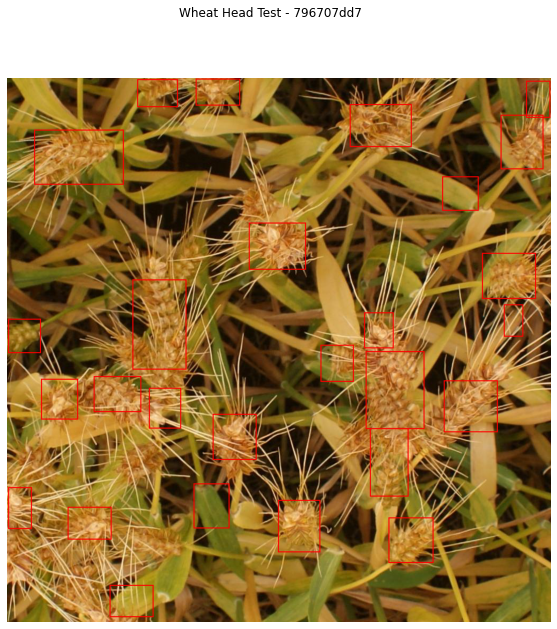

In [72]:
predicted_data = plot_predictions(num_images=num_images,
                     detections=detections,
                     test_image_sizes=image_sizes,
                     test_images_ids=test_image_ids)

# show predicted bboxes on unseen data
# idx is 0...9
idx = 4
show_images(df=predicted_data,
            idx=idx,
            folder=os.path.join('GlobalWheatDetection', 'test'),
            title='Wheat Head Test',
            linecolor='red')

Compare prediction with training data.

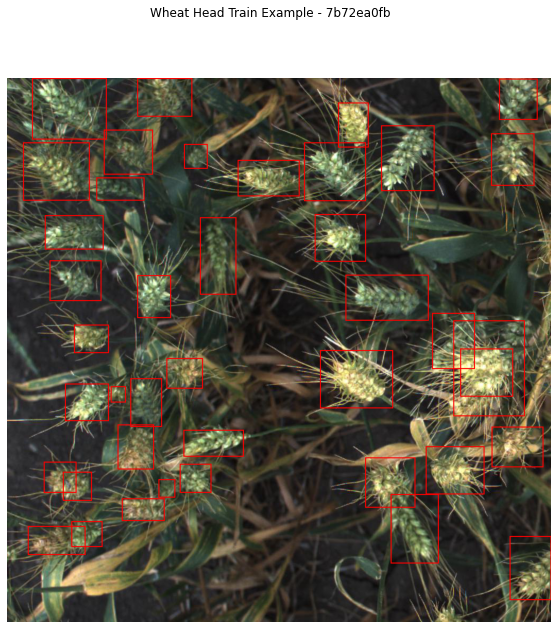

In [73]:
idx = 100
show_images(annotations, idx, '/content/GlobalWheatDetection/train', 'Wheat Head Train Example','red')

In [74]:
image_id = annotations.iloc[idx, :].image_id
path=os.path.join('/content/GlobalWheatDetection/train', image_id + '.jpg')
image=Image.open(path)
h, w = image.size

image_tensor = data_transforms['val'](
                    image=np.array(image, dtype=np.float32),
                    labels=np.ones(1),
                    bboxes=np.array([[0, 0, 1, 1]]) # fake, just need image transformation
                )['image'] 

image_tensor = torch.stack([image_tensor]).float().to(device)
img_info = {
          'img_size': torch.tensor([(h, w)]).float().to(device),
          'img_scale': torch.ones(1).float().to(device)
          }

with torch.no_grad():
  detections = efficient_det_model(image_tensor,
                                   img_info=img_info)
  detections = detections.cpu().numpy()

predicted_data = plot_predictions(num_images=1,
                     detections=detections,
                     test_image_sizes=[(h, w)],
                     test_images_ids=image_id)
predicted_data

Number of test images:  1
Confidence threshold:  0.2
Detected bounding box format:  [3.2545215e+02 1.9067905e+02 3.9160016e+02 2.2579919e+02 3.4000340e-01
 1.0000000e+00]


,image_id,x_min,y_min,x_max,y_max
0,7,72.717863,725.190094,160.149106,798.430007
1,7,110.745435,460.279738,195.890944,516.905253
2,7,86.567013,349.456909,170.391635,415.637760
3,7,439.115132,160.777317,546.520393,217.751073
4,7,225.032341,563.419025,293.393922,658.740055
5,7,953.808496,883.602197,1022.000000,982.450565
6,7,920.751605,646.658047,991.807011,722.111037
7,7,588.847900,271.741928,670.601791,336.792819
8,7,613.120712,33.595347,688.668121,131.899122
9,7,84.610293,262.593205,175.477416,326.417858


Text(0.5, 0.98, 'Wheat Head Train Example - predictions on 7b72ea0fb')

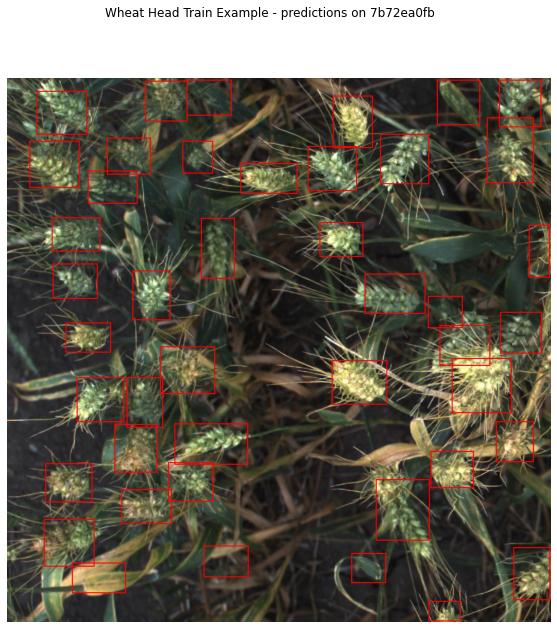

In [75]:
fig, axs = plt.figsize=(10,10)

image=Image.open(path)

objects=predicted_data[['x_min','x_max','y_min','y_max']].values
    # Drawing on the Image
draw=ImageDraw.Draw(image)

for box in objects:
  draw.rectangle([box[0],box[2],box[1],box[3]],width=2,outline='red')

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('off')
        
plt.suptitle(f'Wheat Head Train Example - predictions on {image_id}')